In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
dataset_path = r"..\dataset\CroppedTrainDataAbove50Height"

In [ ]:
# Function Helper
# Data Loading Function
def load_data(path):
    data_dict = {}

    for filename in os.listdir(dataset_path):
        img_path = os.path.join(dataset_path, filename)
        img = cv2.imread(img_path)

        if img is not None:
            data_dict[filename] = img
        else :
            print(f"Error : Can't open image {filename}")

    return data_dict

# Get average size/dim image
def get_average_image_size(images_dict):
    widths = []
    heights = []
    
    for i, (filename, image) in enumerate(images_dict.items()):
        if image is not None:
            h, w = image.shape[:2]
            widths.append(w)
            heights.append(h)
        else:
            print(f"Failed to read image: {filename}")
    
    if widths and heights:
        avg_width = int(np.mean(widths))
        avg_height = int(np.mean(heights))
    else:
        avg_width, avg_height = 0, 0
    
    return avg_width, avg_height

# Image Resize Function
def resize_images(images, size=(100, 100)):
    resized_images = {}
    for filename, image in images.items():
        resized_image = cv2.resize(image, size)
        resized_images[filename] = resized_image
    return resized_images

# Image Visualization
def plot_image_grid(images, num_rows=10, num_cols=10, title="Image Grid", y_title=1, figsize=(50, 50)):
    fig, axes = plt.subplots(num_rows, num_cols, figsize=figsize)

    for i, (filename, image) in enumerate(images.items()):
        if i < num_rows * num_cols:
            row_position = i // num_cols
            col_position = i % num_cols

            axes[row_position, col_position].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            axes[row_position, col_position].axis('off')

    plt.suptitle(title, fontsize=50, y=y_title)
    plt.tight_layout()
    plt.show()


In [4]:
# Load image dataset
pothole_dict = load_data(dataset_path)

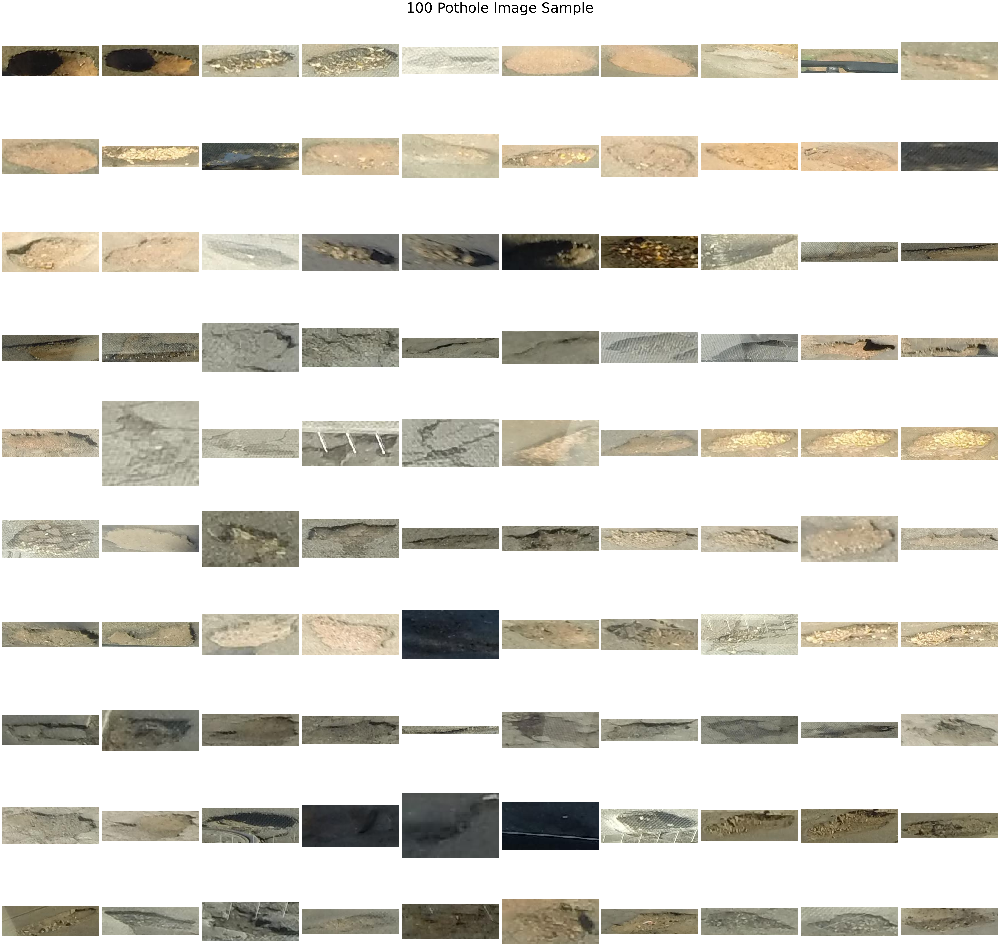

In [9]:
# Visualize
plot_image_grid(pothole_dict, title='100 Pothole Image Sample', y_title=0.98)

In [15]:
# Image Resizing
avg_width, avg_height = get_average_image_size(pothole_dict)
resized_image = resize_images(pothole_dict, size=(avg_width, avg_height))

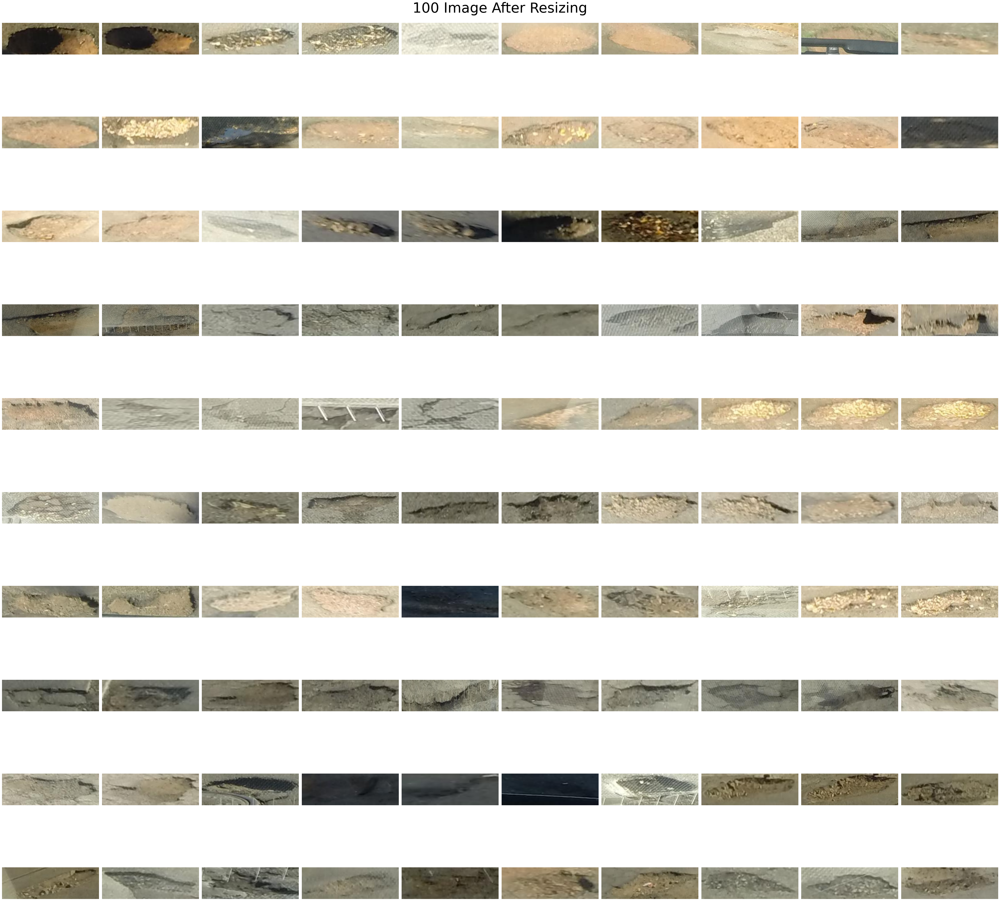

In [ ]:
# Visualize after resizing
plot_image_grid(resized_image, title='100 Image After Resizing', y_title=0.95)